# Planning

## Challenge
The challenge is to forecast prices for core construction materials up to 6 months in the future. The manager of the construction company wants to be able to anticipate upcoming increases in material unit prices.

## Approach
- Plot the data to view annual, monthly, weekly, and daily patterns
- Time series decomposition to identify trends and cyclic/seasonal patterns
- Fit an ARIMA model to predict prices for 6 months

## Results


## Takeaways


In [1]:
import matplotlib.pyplot as plt
import numpy as np
import os
import pandas as pd
import plotly.express as px
import plotly.io as pio
import seaborn as sns
import statsmodels.api as sm

from IPython.display import display
from statsmodels.tsa.seasonal import seasonal_decompose

pio.templates.default = "plotly_white"
sns.set(style="whitegrid", font_scale=1.25)
plt.figure(figsize=(12.8, 9.6), dpi=400)

<Figure size 5120x3840 with 0 Axes>

<Figure size 5120x3840 with 0 Axes>

In [2]:
data_dir = '~/devel/insight-data-challenges/06-clairvoyant-constructor/data'
output_dir = '~/devel/insight-data-challenges/06-clairvoyant-constructor/output'

## Read in and clean the data

In [3]:
df = pd.read_csv(
    os.path.join(os.path.expanduser(data_dir), 'construction_material_prices_2008_2018.csv'),
    parse_dates=['Unnamed: 0']
)

display(df.info())

with pd.option_context('display.max_columns', 100):
    print(df.head(15))

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2945 entries, 0 to 2944
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Unnamed: 0      2945 non-null   datetime64[ns]
 1   price_steel     2309 non-null   float64       
 2   price_rebar     1649 non-null   float64       
 3   price_glass     1472 non-null   float64       
 4   price_concrete  1447 non-null   float64       
 5   price_plywood   2673 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 138.2 KB


None

   Unnamed: 0  price_steel  price_rebar  price_glass  price_concrete  \
0  2007-01-01          NaN          NaN          NaN             NaN   
1  2007-01-03          NaN          NaN          NaN             NaN   
2  2007-01-04          NaN          NaN          NaN             NaN   
3  2007-01-05          NaN          NaN          NaN             NaN   
4  2007-01-08          NaN          NaN          NaN             NaN   
5  2007-01-09          NaN          NaN          NaN             NaN   
6  2007-01-10          NaN          NaN          NaN             NaN   
7  2007-01-11          NaN          NaN          NaN             NaN   
8  2007-01-12          NaN          NaN          NaN             NaN   
9  2007-01-16          NaN          NaN          NaN             NaN   
10 2007-01-17          NaN          NaN          NaN             NaN   
11 2007-01-18          NaN          NaN          NaN             NaN   
12 2007-01-19          NaN          NaN          NaN            

### Name the date column

In [4]:
df = df.rename(columns={'Unnamed: 0': 'Date'})
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2945 entries, 0 to 2944
Data columns (total 6 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            2945 non-null   datetime64[ns]
 1   price_steel     2309 non-null   float64       
 2   price_rebar     1649 non-null   float64       
 3   price_glass     1472 non-null   float64       
 4   price_concrete  1447 non-null   float64       
 5   price_plywood   2673 non-null   float64       
dtypes: datetime64[ns](1), float64(5)
memory usage: 138.2 KB


None

### Check data values

The range of each price looks reasonable

In [5]:
display(df.describe())

,price_steel,price_rebar,price_glass,price_concrete,price_plywood
count,2309.000000,1649.000000,1472.000000,1447.000000,2673.000000
mean,12.611319,18.306339,29.997962,26.000636,12.775067
std,6.038862,8.587938,6.524622,7.314764,3.931698
min,3.062500,3.000000,16.000000,10.416667,5.000000
25%,8.500000,12.071429,25.000000,20.559028,10.125000
50%,10.500000,16.500000,29.000000,25.043478,12.125000
75%,14.833333,22.500000,35.000000,30.000000,14.333333
max,41.000000,55.000000,48.000000,50.000000,34.000000


Range of dates also looks reasonable

In [6]:
display(df['Date'].min(), df['Date'].max())

Timestamp('2007-01-01 00:00:00')

Timestamp('2018-06-19 00:00:00')

### Reshape the data

In [7]:
# df2 = pd.wide_to_long(df, stubnames='price', i='Date', j='material')
price_cols = df.columns[df.columns.str.startswith('price_')]
df_longer = df.melt(var_name='Material', value_name='Price', id_vars=['Date'], value_vars=price_cols)
df_longer['Material'] = df_longer['Material'].str.replace('price_', '')
display(df_longer)

,Date,Material,Price
0,2007-01-01,steel,NaN
1,2007-01-03,steel,NaN
2,2007-01-04,steel,NaN
3,2007-01-05,steel,NaN
4,2007-01-08,steel,NaN
...,...,...,...
14720,2018-06-13,plywood,NaN
14721,2018-06-14,plywood,NaN
14722,2018-06-15,plywood,NaN
14723,2018-06-18,plywood,NaN


### Remove NaN rows

In [8]:
# old_shape = df.shape
# df = df.dropna(subset=price_cols, how='all')
# new_shape = df.shape
# display(old_shape[0] - new_shape[0])

In [9]:
# old_shape = df_longer.shape
# df_longer = df_longer.dropna(subset=['Price'], how='all')
# new_shape = df_longer.shape
# display(old_shape[0] - new_shape[0])

### Remove initial NaN rows

Many of the first rows in the data are NaN

In [10]:
first_valid_idx = df[price_cols].isna().any(axis=1).idxmin()
df = df.loc[first_valid_idx:]

Leave the NaNs because I'll need them for the time series aspect

## Add variables for date components

In [11]:
df['year'] = df['Date'].dt.year.astype('category')
df['month'] = df['Date'].dt.month.astype('category')
df['day'] = df['Date'].dt.day
df['dayofyear'] = df['Date'].dt.dayofyear
df['dayofweek'] = df['Date'].dt.dayofweek.astype('category')
df['isweekday'] = df['dayofweek'].isin(range(5))
df['week'] = df['Date'].dt.week.astype('category')
display(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2586 entries, 359 to 2944
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype         
---  ------          --------------  -----         
 0   Date            2586 non-null   datetime64[ns]
 1   price_steel     2191 non-null   float64       
 2   price_rebar     1581 non-null   float64       
 3   price_glass     1341 non-null   float64       
 4   price_concrete  1326 non-null   float64       
 5   price_plywood   2435 non-null   float64       
 6   year            2586 non-null   category      
 7   month           2586 non-null   category      
 8   day             2586 non-null   int64         
 9   dayofyear       2586 non-null   int64         
 10  dayofweek       2586 non-null   category      
 11  isweekday       2586 non-null   bool          
 12  week            2586 non-null   category      
dtypes: bool(1), category(4), datetime64[ns](1), float64(5), int64(2)
memory usage: 178.5 KB


None

In [12]:
df_longer['year'] = df_longer['Date'].dt.year.astype('category')
df_longer['month'] = df_longer['Date'].dt.month.astype('category')
df_longer['day'] = df_longer['Date'].dt.day
df_longer['dayofyear'] = df_longer['Date'].dt.dayofyear
df_longer['dayofweek'] = df_longer['Date'].dt.dayofweek.astype('category')
df_longer['isweekday'] = df_longer['dayofweek'].isin(range(5))
df_longer['week'] = df_longer['Date'].dt.week.astype('category')
display(df_longer.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 14725 entries, 0 to 14724
Data columns (total 10 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   Date       14725 non-null  datetime64[ns]
 1   Material   14725 non-null  object        
 2   Price      9550 non-null   float64       
 3   year       14725 non-null  category      
 4   month      14725 non-null  category      
 5   day        14725 non-null  int64         
 6   dayofyear  14725 non-null  int64         
 7   dayofweek  14725 non-null  category      
 8   isweekday  14725 non-null  bool          
 9   week       14725 non-null  category      
dtypes: bool(1), category(4), datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 651.3+ KB


None

### Examine sample size by material type

In [13]:
df_longer.groupby('Material')['Date'].count()
df_longer.groupby(['Material', 'year'])['Date'].count()

Material  year
concrete  2007    256
          2008    259
          2009    258
          2010    256
          2011    256
          2012    258
          2013    257
          2014    259
          2015    258
          2016    256
          2017    254
          2018    118
glass     2007    256
          2008    259
          2009    258
          2010    256
          2011    256
          2012    258
          2013    257
          2014    259
          2015    258
          2016    256
          2017    254
          2018    118
plywood   2007    256
          2008    259
          2009    258
          2010    256
          2011    256
          2012    258
          2013    257
          2014    259
          2015    258
          2016    256
          2017    254
          2018    118
rebar     2007    256
          2008    259
          2009    258
          2010    256
          2011    256
          2012    258
          2013    257
          2014    259
          2015   

There are some year/material combinations with far fewer data points

## Plot everything

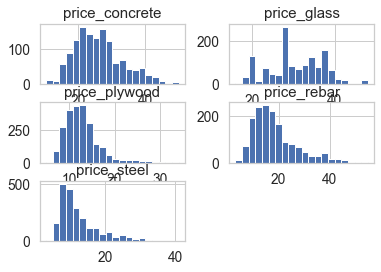

In [14]:
df[price_cols].hist(bins=20)
plt.show()

In [15]:
# price faceted by material, in boxplots by year

In [16]:
# fig = px.box(df_longer, y='Price', x='year', color='Material')
# fig.show()
# 
# fig = px.box(df_longer, y='Price', x='year', facet_col='Material', facet_col_wrap=3)
# fig.show()
# 
fig = px.box(df_longer, y='Price', x='Material', color='year')
fig.show()

fig = px.box(df_longer.sort_values('month'), y='Price', x='Material', color='month')
fig.show()

fig = px.box(df_longer.sort_values('dayofweek'), y='Price', x='Material', color='dayofweek')
fig.show()

fig = px.line(df_longer.sort_values('Date'), x='Date', y='Price', line_group='Material', color='Material',
              height=800)
fig.show()

# Looks like plywood and glass have an upward trend over the years, but the other materials look more stable with cyclic patterns

fig = px.line(df_longer.sort_values('Date'), x='Date', y='Price', line_group='Material', color='Material',
              facet_row='year', height=1400)
fig.update_xaxes(matches=None)
fig.show()

# g = sns.catplot(x='year', y='Price', hue='year', row='Material', data=df_longer, kind='box')
# plt.show()
# 
# for m in df_longer['Material'].unique():
#     g = sns.catplot(x='year', y='Price', hue='year', row='Material', data=df_longer[],
#                     kind='box', facet_kws={'sharey': False})
#     plt.show()
# 

## Time series decomposition

### Format for time series

In [17]:
df = df.set_index('Date')  # Set the datetimeindex
df = df.resample('B').pad()  # Set sample frequency to every business day
display(df.info())

# Don't make df_longer datetimeindexed because it doesn't work properly with repeated index values
# # Re-create the reshaped data with the new index
# df_longer = df.melt(var_name='Material', value_name='Price',
#                     id_vars=df.drop(price_cols, axis=1).columns,
#                     value_vars=price_cols)
# df_longer['Material'] = df_longer['Material'].str.replace('price_', '')
# display(df_longer)
# display(df_longer.info())
# df_longer.index

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2626 entries, 2008-05-27 to 2018-06-19
Freq: B
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype   
---  ------          --------------  -----   
 0   price_steel     2252 non-null   float64 
 1   price_rebar     1636 non-null   float64 
 2   price_glass     1371 non-null   float64 
 3   price_concrete  1356 non-null   float64 
 4   price_plywood   2501 non-null   float64 
 5   year            2626 non-null   category
 6   month           2626 non-null   category
 7   day             2626 non-null   int64   
 8   dayofyear       2626 non-null   int64   
 9   dayofweek       2626 non-null   category
 10  isweekday       2626 non-null   bool    
 11  week            2626 non-null   category
dtypes: bool(1), category(4), float64(5), int64(2)
memory usage: 181.0 KB


None

### Fill in NA values

Because the time series functions don't like missing values

In [18]:
df_filled = df.copy()
for m in price_cols:
    df_filled[m] = df_filled[m].fillna(method='ffill')
df_filled

,price_steel,price_rebar,price_glass,price_concrete,price_plywood,year,month,day,dayofyear,dayofweek,isweekday,week
Date,,,,,,,,,,,,
2008-05-27,11.625000,16.50,20.0,38.000000,8.125,2008,5,27,148,1,True,22
2008-05-28,11.625000,17.25,20.0,38.500000,11.000,2008,5,28,149,2,True,22
2008-05-29,11.625000,17.25,20.0,38.500000,8.250,2008,5,29,150,3,True,22
2008-05-30,11.500000,14.25,20.0,29.600000,8.000,2008,5,30,151,4,True,22
2008-06-02,10.833333,16.50,20.0,30.666667,8.000,2008,6,2,154,0,True,23
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-06-13,8.750000,23.00,34.0,48.000000,13.500,2018,6,13,164,2,True,24
2018-06-14,8.750000,23.00,34.0,48.000000,13.500,2018,6,14,165,3,True,24
2018-06-15,8.750000,23.00,34.0,48.000000,13.500,2018,6,15,166,4,True,24


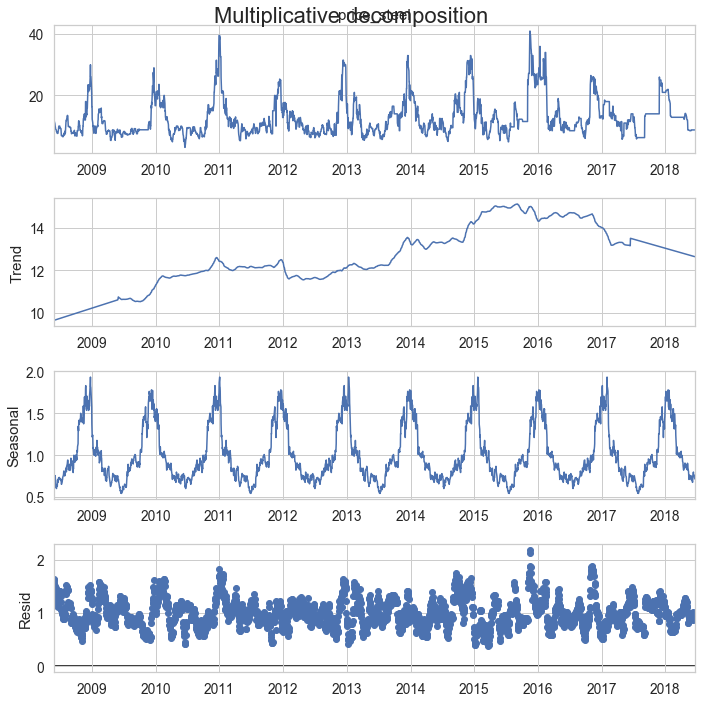

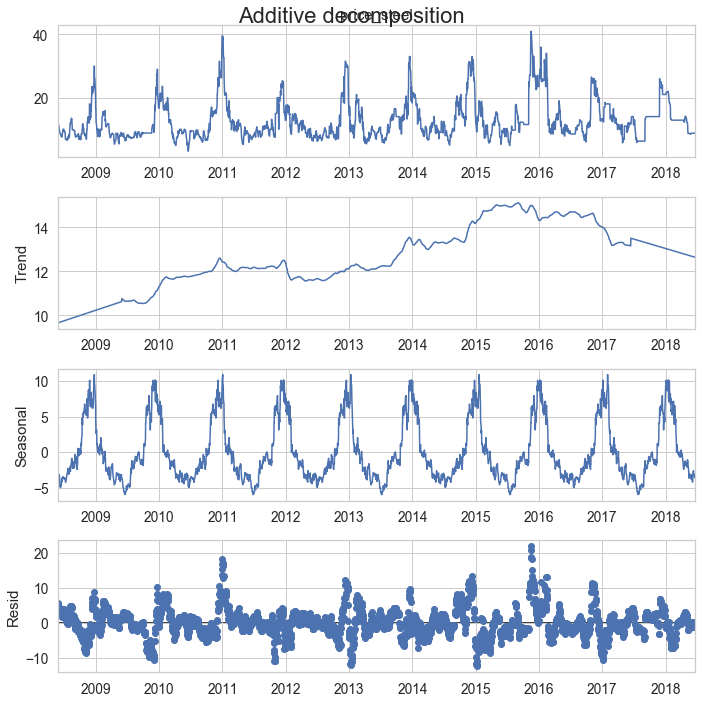

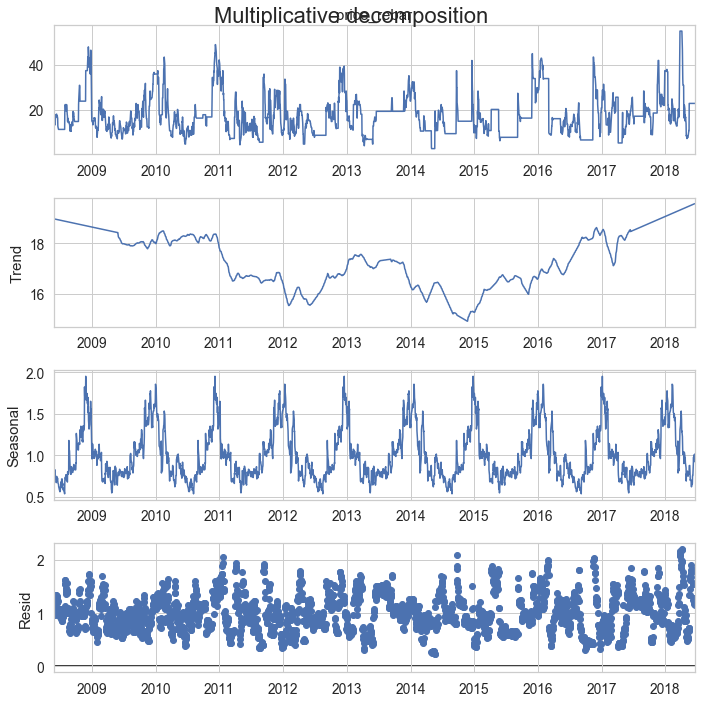

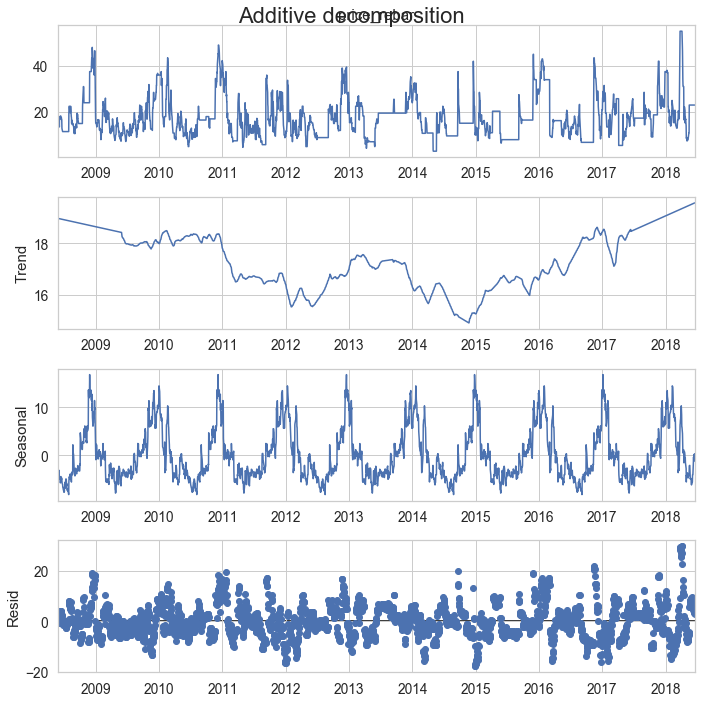

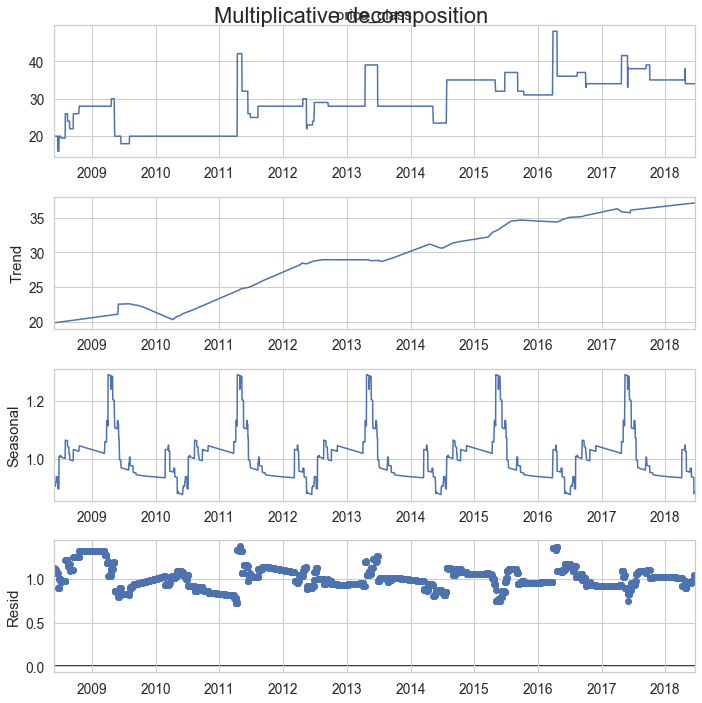

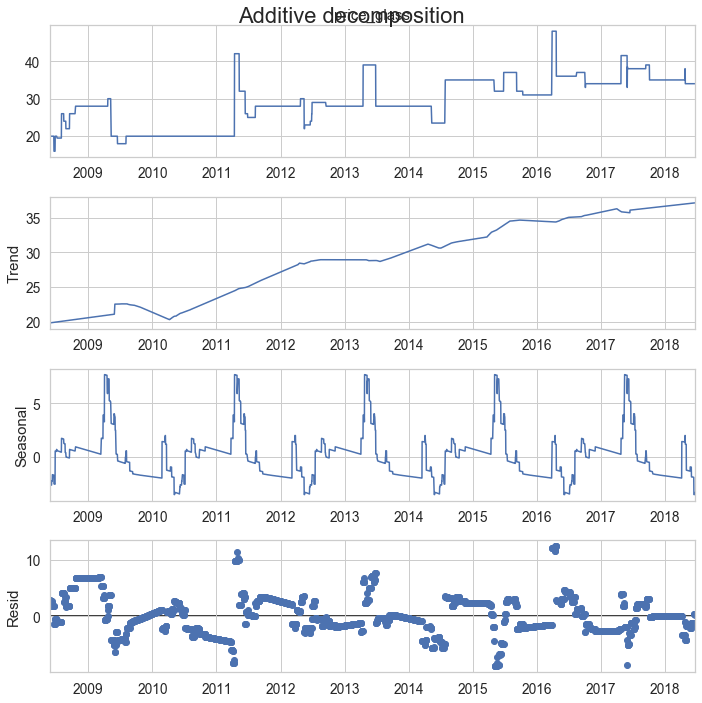

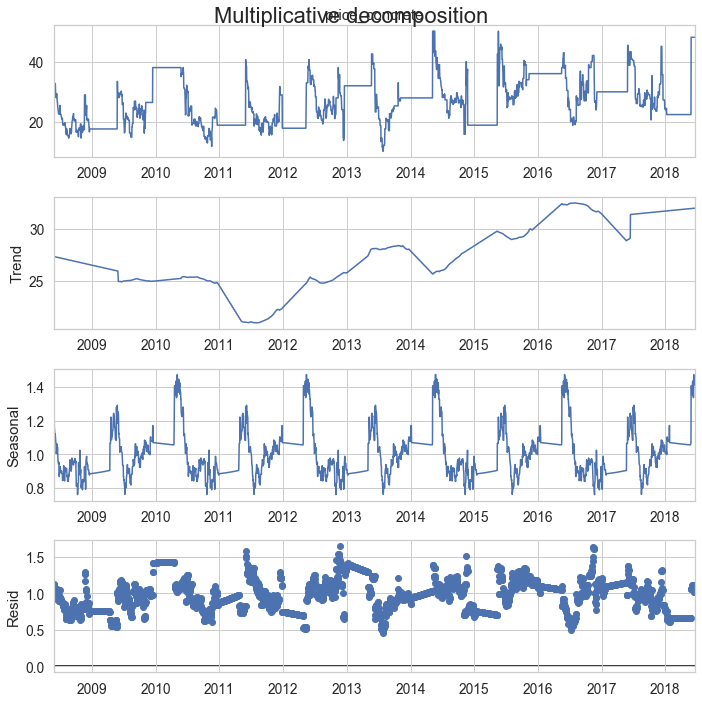

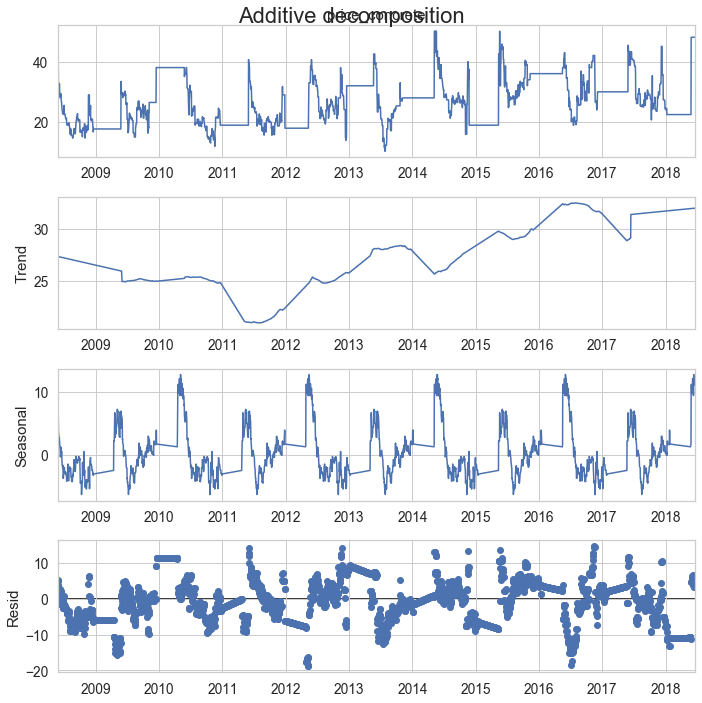

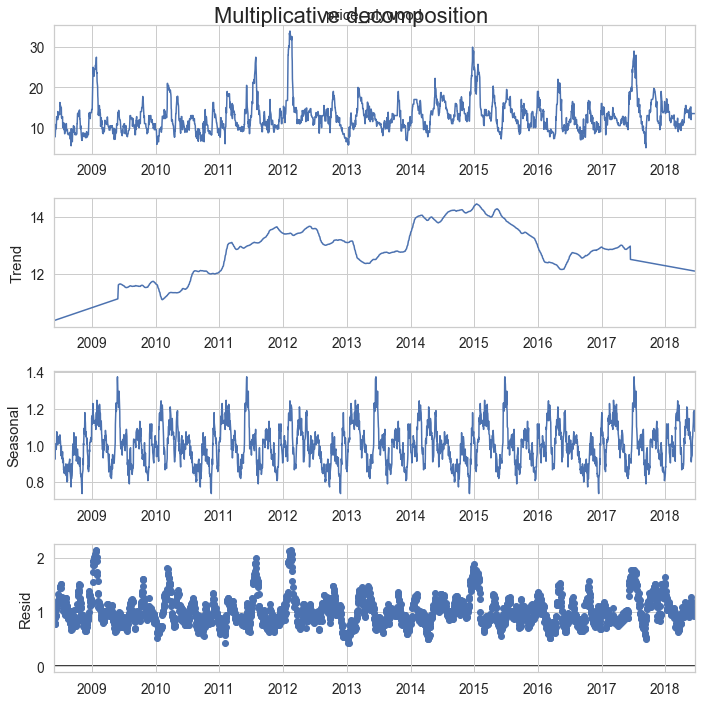

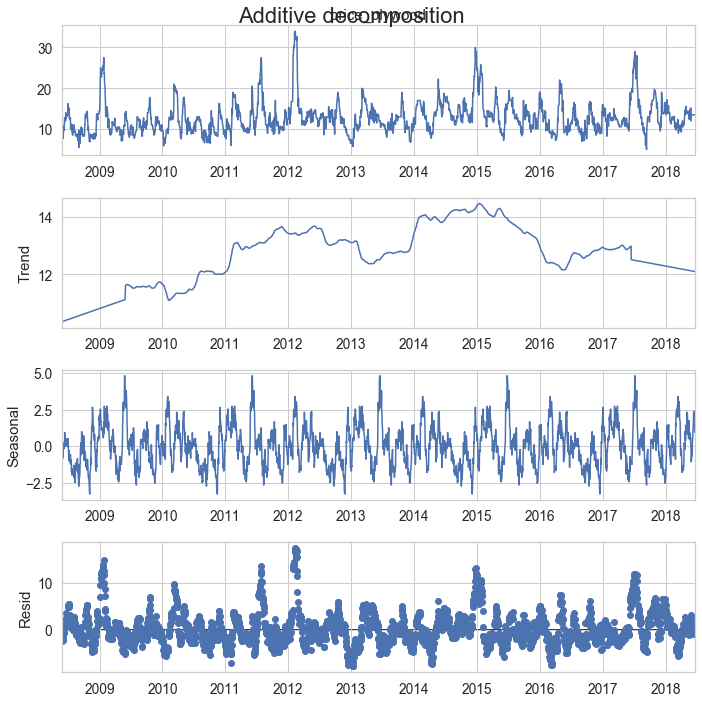

In [19]:
# Find the number of weeks in the dataset
decomposition_period = df_filled[['week', 'year']].drop_duplicates().shape[0]
# I'm not quite sure why this makes any sense, but it looks ok?

# m = 'price_rebar'
for m in price_cols:
    result_mul = seasonal_decompose(df_filled[m],
                                    period=decomposition_period,
                                    model='multiplicative',
                                    extrapolate_trend='freq')
    result_add = seasonal_decompose(df_filled[m],
                                    period=decomposition_period,
                                    model='additive',
                                    extrapolate_trend='freq')
    plt.rcParams.update({'figure.figsize': (10, 10)})
    result_mul.plot().suptitle('Multiplicative decomposition', fontsize=22)
    result_add.plot().suptitle('Additive decomposition', fontsize=22)
    plt.show()

This doesn't look right, but I'm not sure why

## Test for stationarity

In [20]:
from statsmodels.tsa.stattools import adfuller

adf_pvals = []
for m in price_cols:
    result = adfuller(df_filled[m], autolag='AIC')
    adf_pvals.append(result[1])
    print('-' * 25)
    print(m)
    print(f'\tADF Statistic: {result[0]}')
    print(f'\tp-value: {result[1]}')
    for key, value in result[4].items():
        print('\tCritial Values:')
        print(f'\t\t{key}, {value}')

display([(m, p < 0.05) for m, p in zip(price_cols, adf_pvals)])

-------------------------
price_steel
	ADF Statistic: -6.51328173891808
	p-value: 1.086935504787725e-08
	Critial Values:
		1%, -3.4328608364042927
	Critial Values:
		5%, -2.8626492942003465
	Critial Values:
		10%, -2.567360516871384
-------------------------
price_rebar
	ADF Statistic: -8.313163121628262
	p-value: 3.7413908260892046e-13
	Critial Values:
		1%, -3.432850276300277
	Critial Values:
		5%, -2.8626446306749416
	Critial Values:
		10%, -2.5673580339787834
-------------------------
price_glass
	ADF Statistic: -3.077373340666178
	p-value: 0.028273611394599545
	Critial Values:
		1%, -3.43286180083873
	Critial Values:
		5%, -2.8626497201105283
	Critial Values:
		10%, -2.5673607436289947
-------------------------
price_concrete
	ADF Statistic: -4.831685323967146
	p-value: 4.7282847075739514e-05
	Critial Values:
		1%, -3.4328531475091717
	Critial Values:
		5%, -2.862645898652306
	Critial Values:
		10%, -2.5673587090582717
-------------------------
price_plywood
	ADF Statistic: -8.882

[('price_steel', True),
 ('price_rebar', True),
 ('price_glass', True),
 ('price_concrete', True),
 ('price_plywood', True)]

Null hypothesis of the ADF test is that the time series is non-stationary, so with a significant p value that means it's stationary. All five materials come out as stationary, so there's not much trend to speak of.

## Look for seasonality in autocorrelation plots

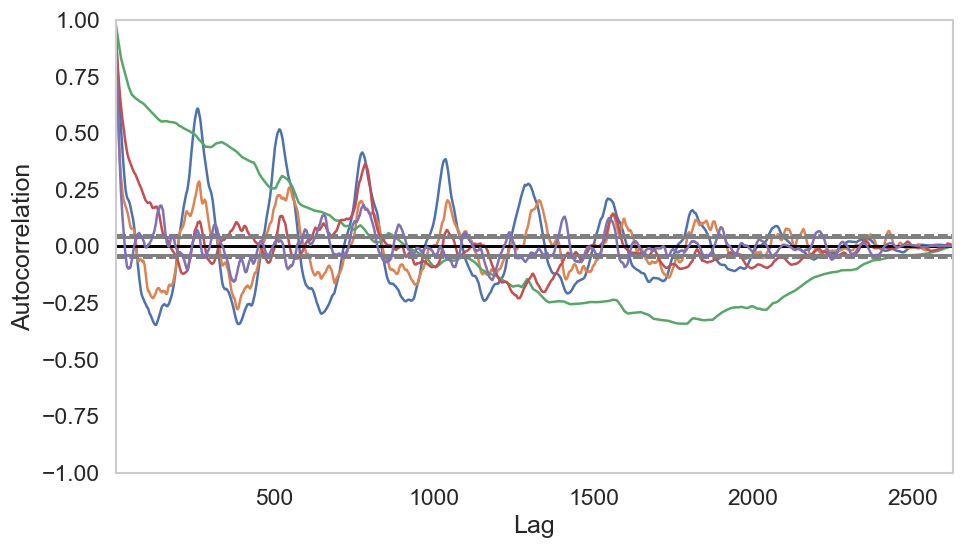

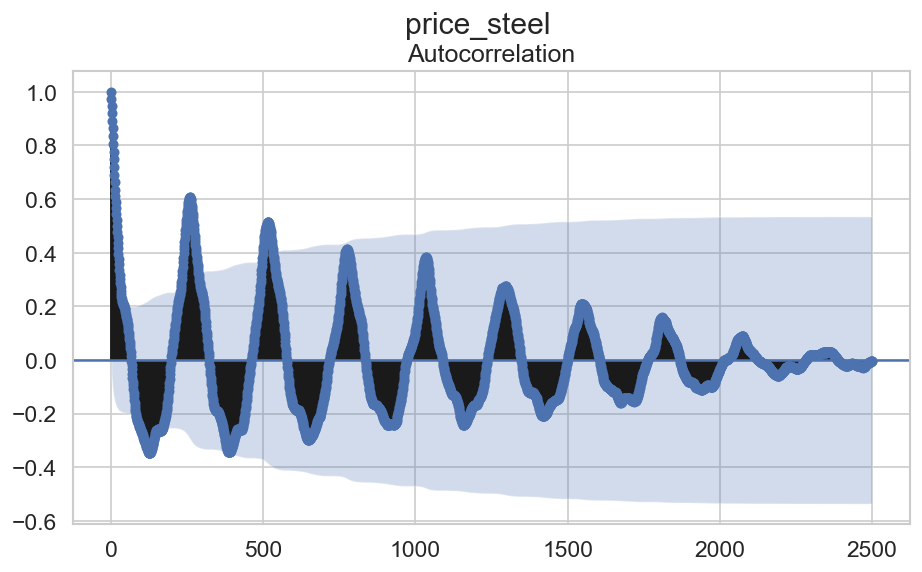

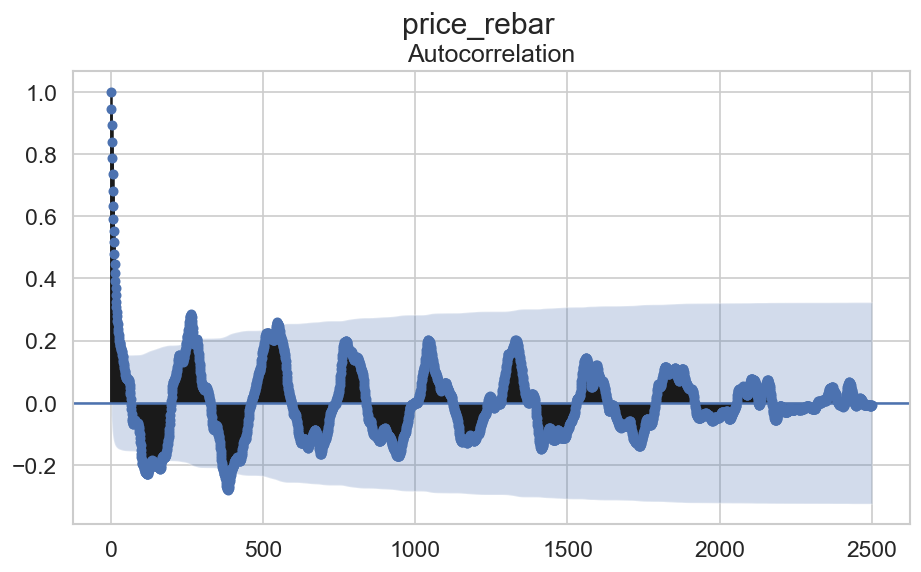

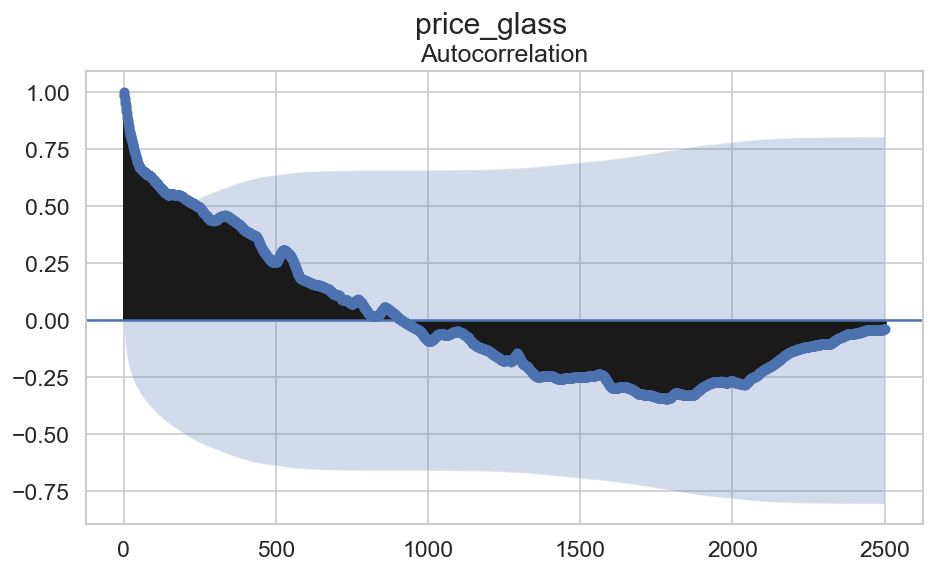

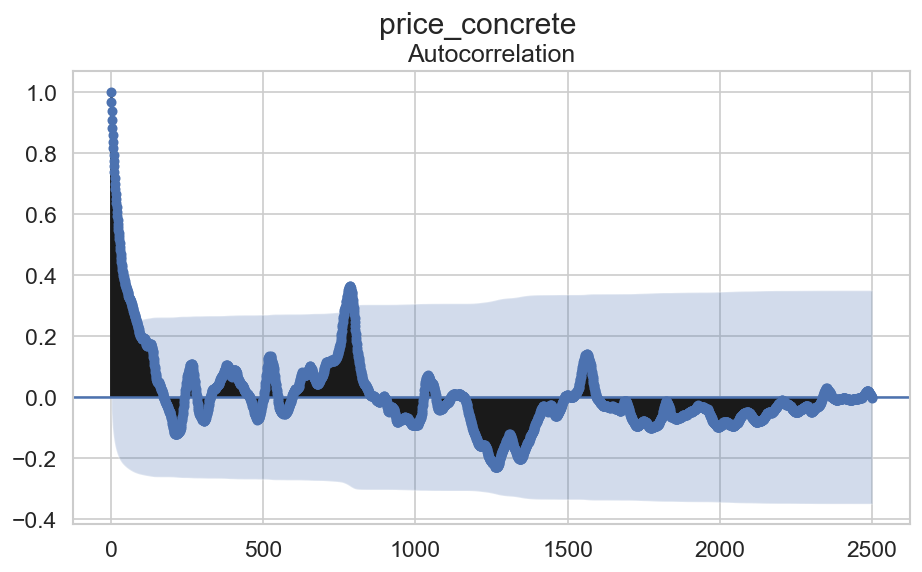

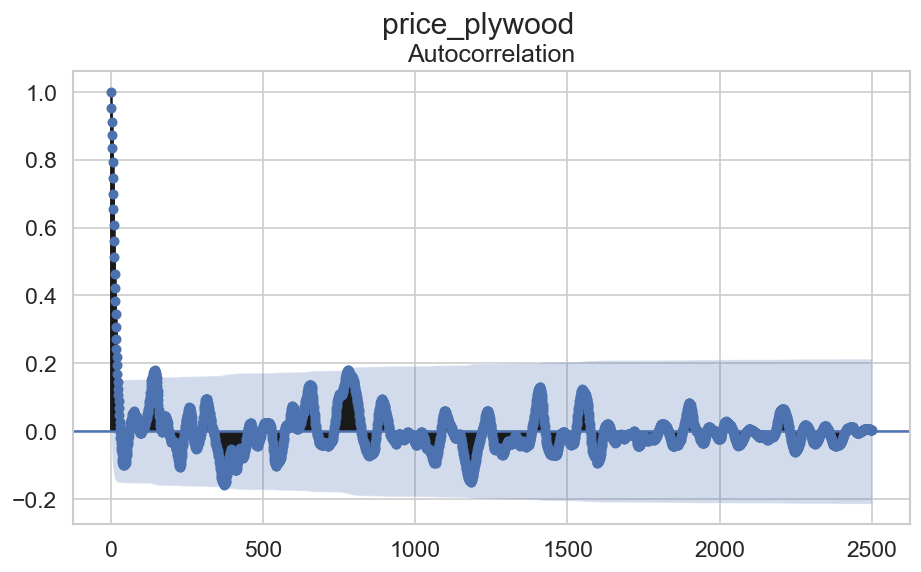

In [21]:
from pandas.plotting import autocorrelation_plot

plt.rcParams.update({'figure.figsize': (9, 5), 'figure.dpi': 120})
for m in price_cols:
    ax = autocorrelation_plot(df_filled[m].tolist())

plt.show()

# Try the statsmodels plotting instead
for m in price_cols:
    sm.graphics.tsa.plot_acf(df_filled[m], lags=2500).suptitle(m, fontsize=18)
    plt.show()

## Forecast using ARIMA

I'll be using univariate forecasting

p: number of lags to use as predictors (order of AR autoregressive term)
d: probably 0 because the prices are already stationary
q: number of lagged forecast errors to include (order of MA moving average term)

Add S if there is seasonality for SARIMA

### Determine order of AR term (p)

p is the number of lags that cross the significance threshold in the partial autocorrelation plot

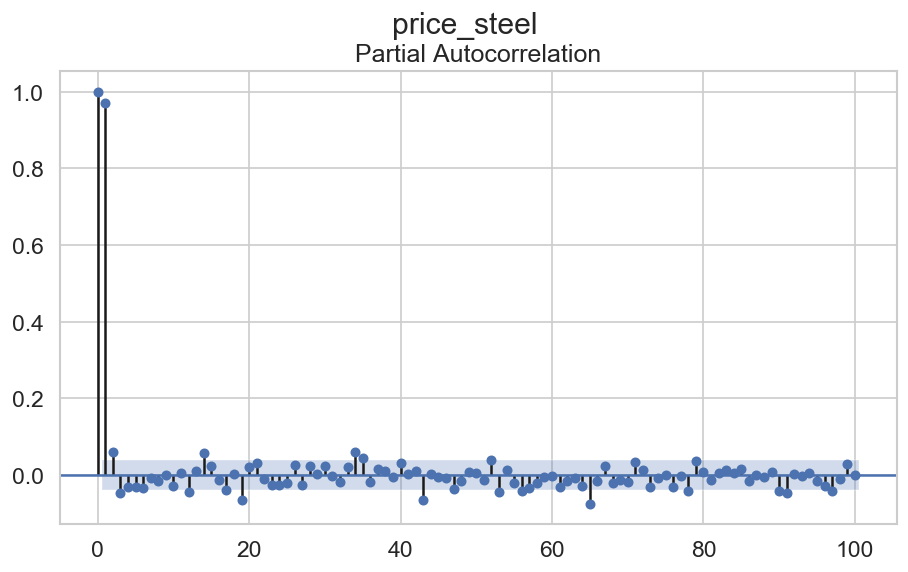

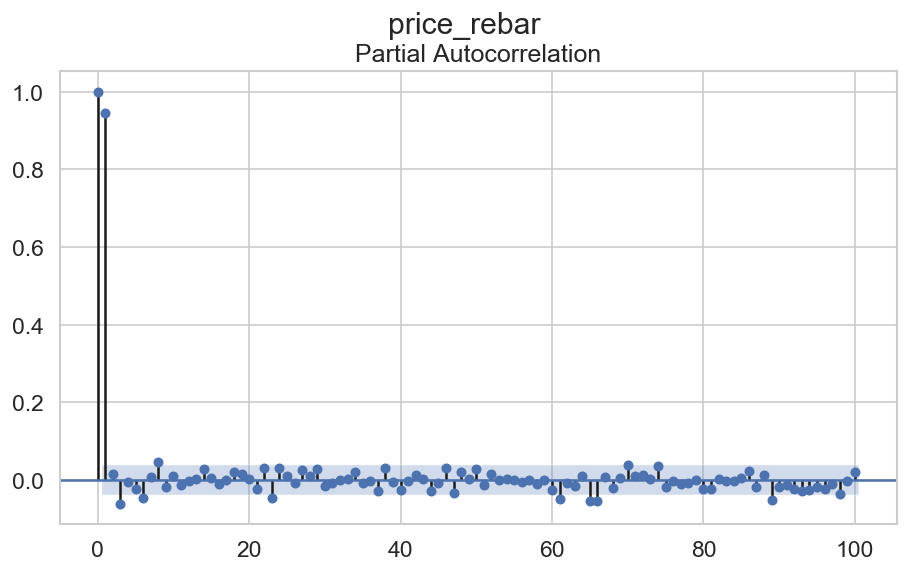

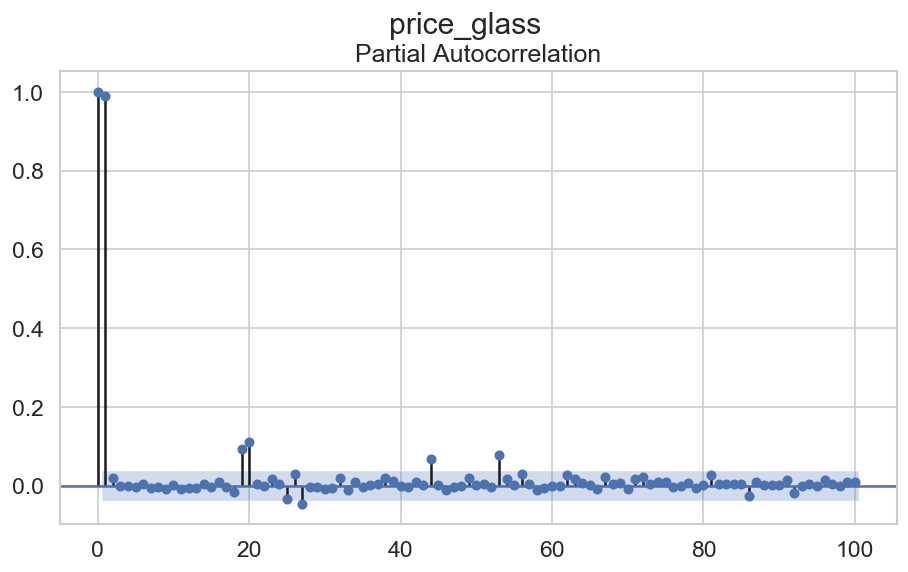

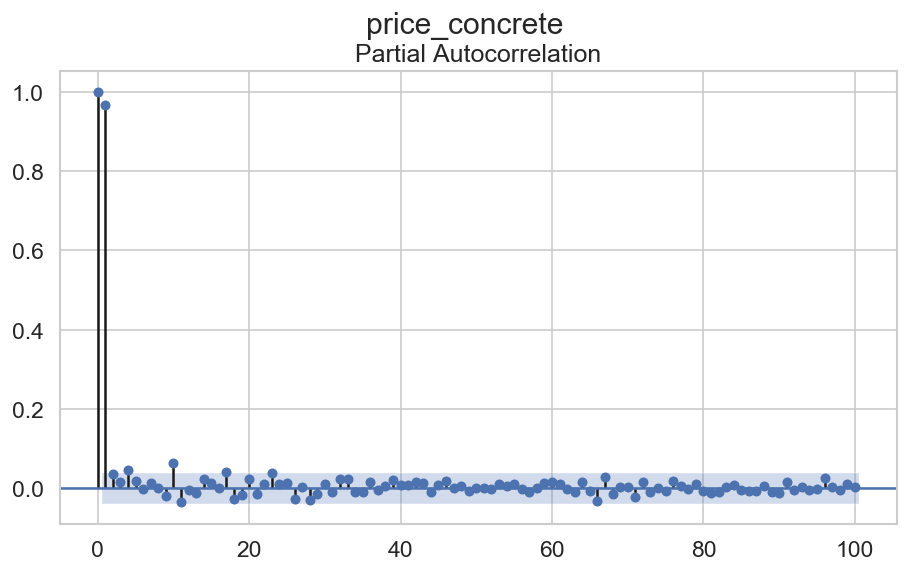

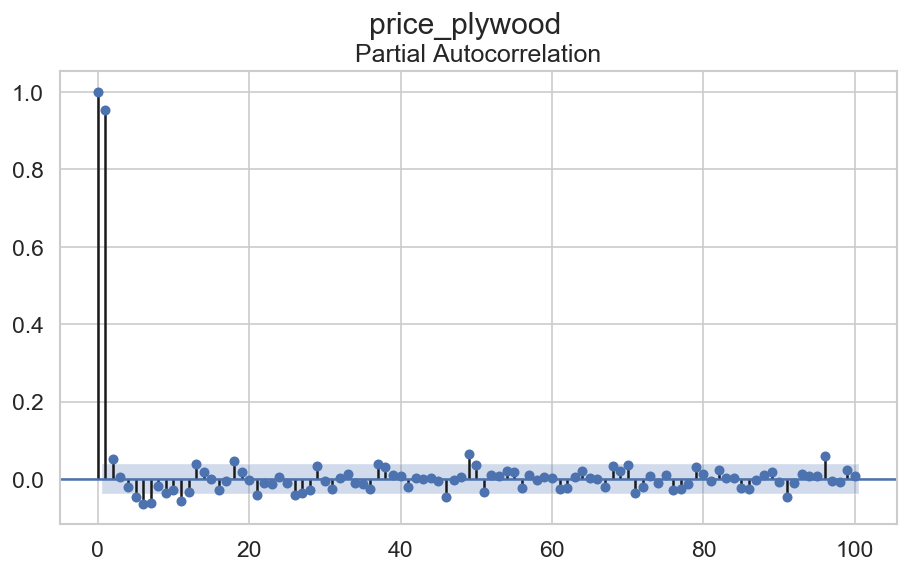

In [22]:
for m in price_cols:
    sm.graphics.tsa.plot_pacf(df_filled[m], lags=100).suptitle(m, fontsize=18)
    plt.show()

steel: 1
rebar: 1
glass: 1
concrete: 1
plywood: 1

### Determine order of the MA term (q)

How many MA terms required to remove autocorrelation
The number of lags the cross the significance threshold in the autocorrelation plot

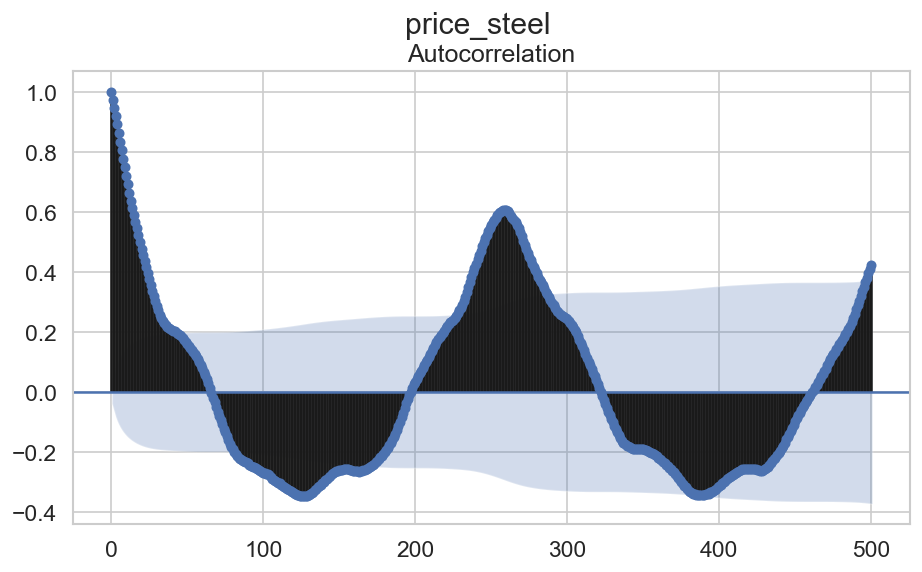

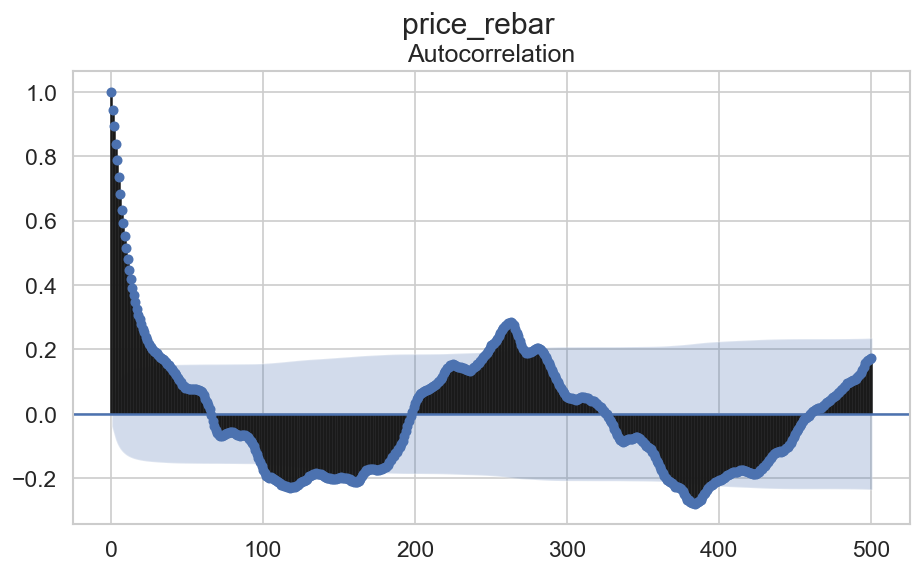

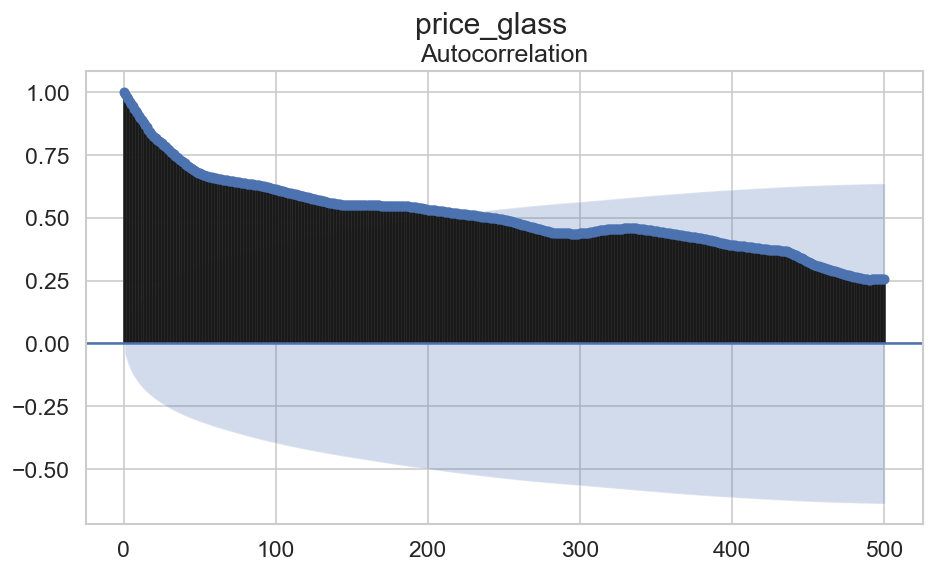

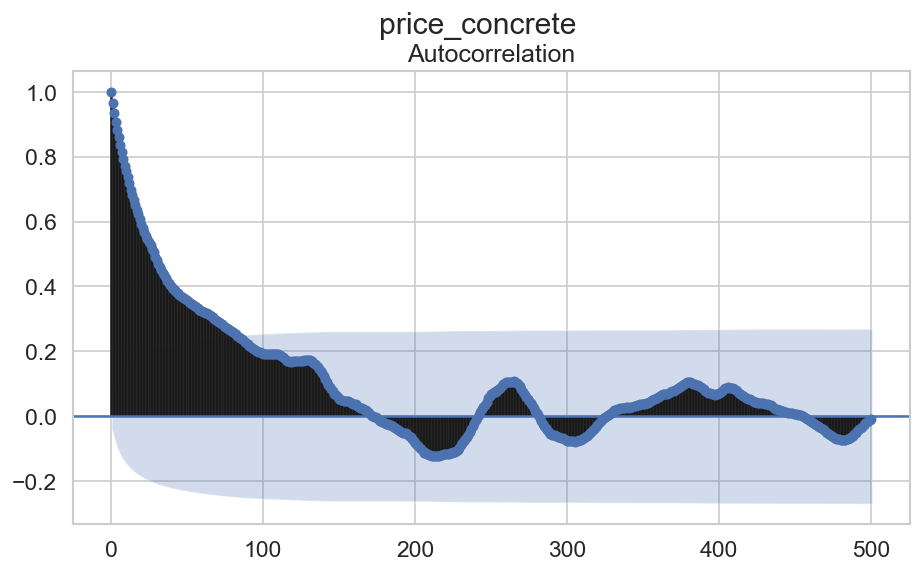

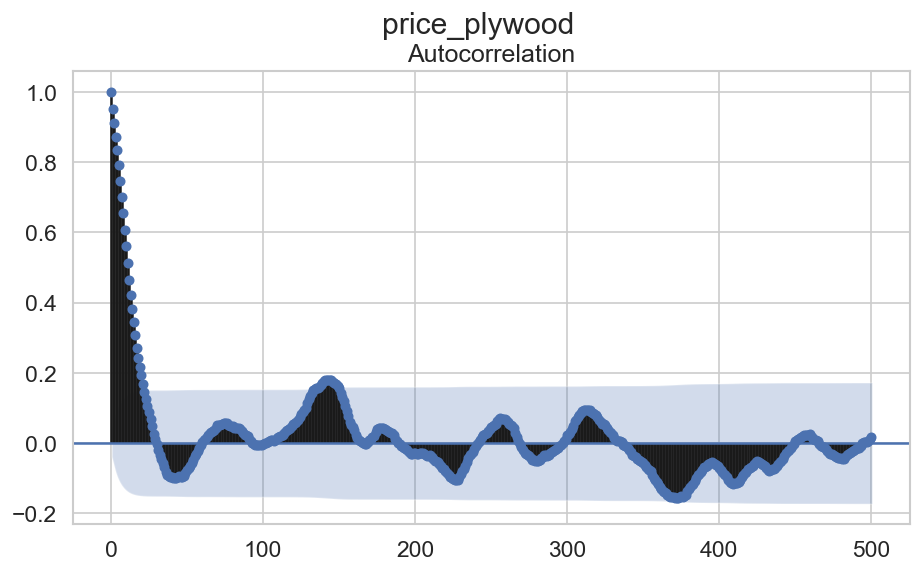

In [23]:
for m in price_cols:
    sm.graphics.tsa.plot_acf(df_filled[m], lags=500).suptitle(m, fontsize=18)
    plt.show()

steel: 30 - 43
rebar: 27 - 36
glass: ~200
concrete: 60 - 80
plywood: 21

### Set parameters for ARIMA

In [24]:
arima_params = {
    'price_steel': {'p': 1, 'q': 30},
    'price_rebar': {'p': 1, 'q': 27},
    'price_glass': {'p': 1, 'q': 200},
    'price_concrete': {'p': 1, 'q': 60},
    'price_plywood': {'p': 1, 'q': 21}
}
display(arima_params)

{'price_steel': {'p': 1, 'q': 30},
 'price_rebar': {'p': 1, 'q': 27},
 'price_glass': {'p': 1, 'q': 200},
 'price_concrete': {'p': 1, 'q': 60},
 'price_plywood': {'p': 1, 'q': 21}}

### Fit initial ARIMA models

In [25]:
for m in price_cols:
    # m_order = (arima_params[m]['p'], 0, arima_params[m]['q'])
    m_order = (arima_params[m]['p'], 0, 10)
    model = sm.tsa.arima.ARIMA(df_filled[m], order=m_order)
    model_fit = model.fit()
    print('-' * 25)
    print(m)
    print(model_fit.summary())


-------------------------
price_steel
                               SARIMAX Results                                
Dep. Variable:            price_steel   No. Observations:                 2626
Model:                ARIMA(1, 0, 10)   Log Likelihood               -4676.860
Date:                Tue, 31 Mar 2020   AIC                           9379.720
Time:                        13:30:42   BIC                           9456.072
Sample:                    05-27-2008   HQIC                          9407.370
                         - 06-19-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.6512      1.156     10.944      0.000      10.385      14.917
ar.L1          0.9608      0.006    153.632      0.000       0.949       0.973
ma.L1         

-------------------------
price_plywood
                               SARIMAX Results                                
Dep. Variable:          price_plywood   No. Observations:                 2626
Model:                ARIMA(1, 0, 10)   Log Likelihood               -4169.905
Date:                Tue, 31 Mar 2020   AIC                           8365.810
Time:                        13:30:54   BIC                           8442.162
Sample:                    05-27-2008   HQIC                          8393.460
                         - 06-19-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.8158      0.463     27.679      0.000      11.908      13.723
ar.L1          0.9201      0.010     90.525      0.000       0.900       0.940
ma.L1       

### Get training and test sets for at least 6 months

In [26]:
train_max_idx = round(df_filled.shape[0] * 0.8) - 1
train = df_filled.iloc[:train_max_idx]
train.shape
test = df_filled.iloc[train_max_idx: ]
test.shape

df_filled.index[-1] - test.index[0]

Timedelta('735 days 00:00:00')

### Out of time cross validation

-------------------------
price_steel
                               SARIMAX Results                                
Dep. Variable:            price_steel   No. Observations:                 2626
Model:                ARIMA(1, 0, 10)   Log Likelihood               -4676.860
Date:                Tue, 31 Mar 2020   AIC                           9379.720
Time:                        13:30:56   BIC                           9456.072
Sample:                    05-27-2008   HQIC                          9407.370
                         - 06-19-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.6512      1.156     10.944      0.000      10.385      14.917
ar.L1          0.9608      0.006    153.632      0.000       0.949       0.973
ma.L1         

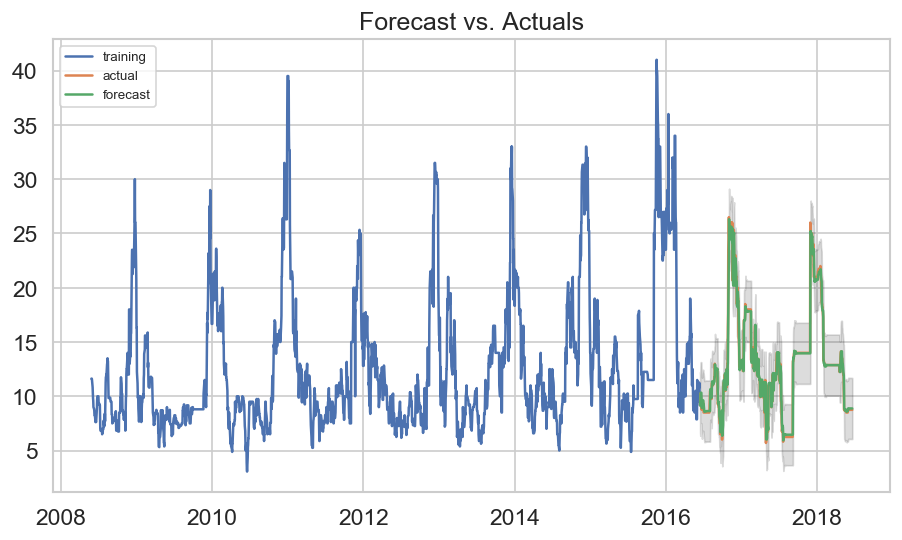

-------------------------
price_rebar
                               SARIMAX Results                                
Dep. Variable:            price_rebar   No. Observations:                 2626
Model:                ARIMA(1, 0, 10)   Log Likelihood               -6453.112
Date:                Tue, 31 Mar 2020   AIC                          12932.225
Time:                        13:30:59   BIC                          13008.577
Sample:                    05-27-2008   HQIC                         12959.875
                         - 06-19-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         17.4623      1.165     14.983      0.000      15.178      19.747
ar.L1          0.9299      0.013     69.287      0.000       0.904       0.956
ma.L1       2.

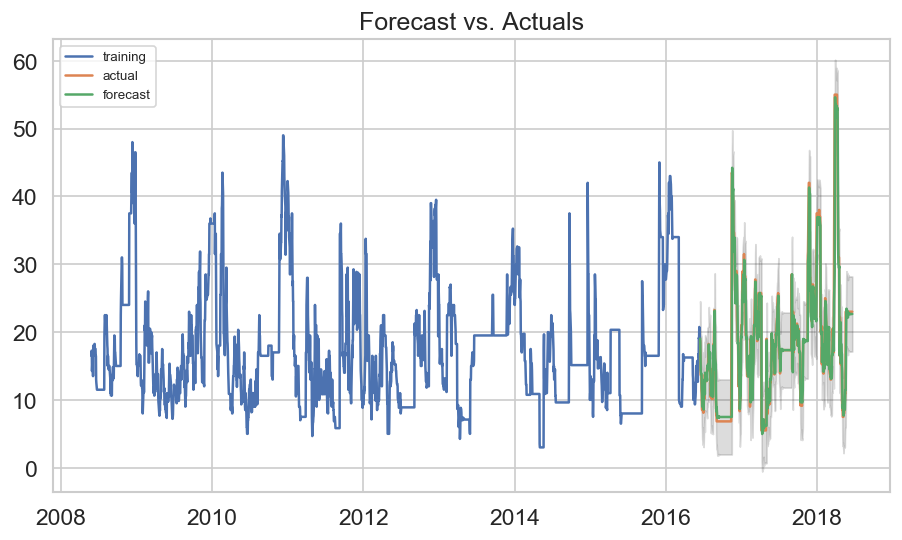

-------------------------
price_glass
                               SARIMAX Results                                
Dep. Variable:            price_glass   No. Observations:                 2626
Model:                ARIMA(1, 0, 10)   Log Likelihood               -3386.911
Date:                Tue, 31 Mar 2020   AIC                           6799.823
Time:                        13:31:02   BIC                           6876.174
Sample:                    05-27-2008   HQIC                          6827.473
                         - 06-19-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         29.0933      2.124     13.694      0.000      24.929      33.257
ar.L1          0.9903      0.005    189.584      0.000       0.980       1.001
ma.L1         

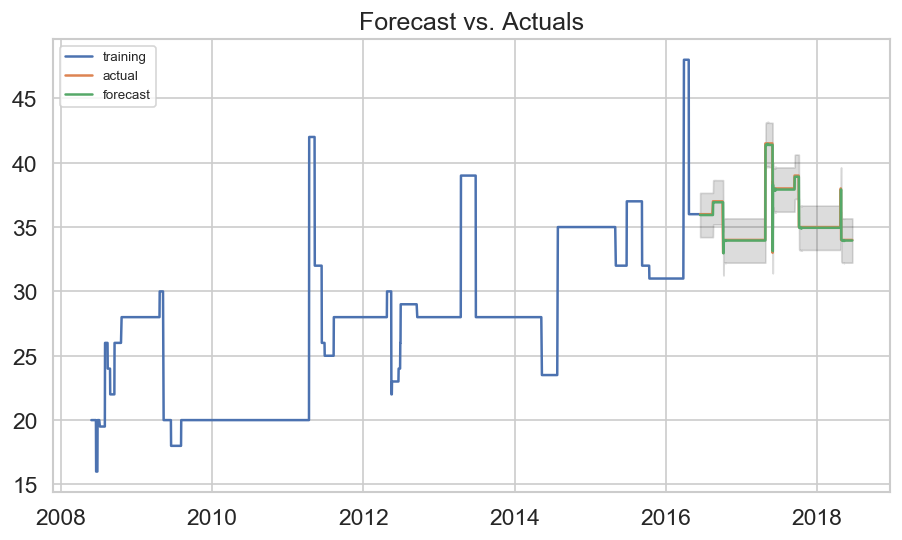

-------------------------
price_concrete
                               SARIMAX Results                                
Dep. Variable:         price_concrete   No. Observations:                 2626
Model:                ARIMA(1, 0, 10)   Log Likelihood               -5375.564
Date:                Tue, 31 Mar 2020   AIC                          10777.128
Time:                        13:31:06   BIC                          10853.480
Sample:                    05-27-2008   HQIC                         10804.778
                         - 06-19-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         27.0446      1.744     15.511      0.000      23.627      30.462
ar.L1          0.9786      0.007    147.729      0.000       0.966       0.992
ma.L1      

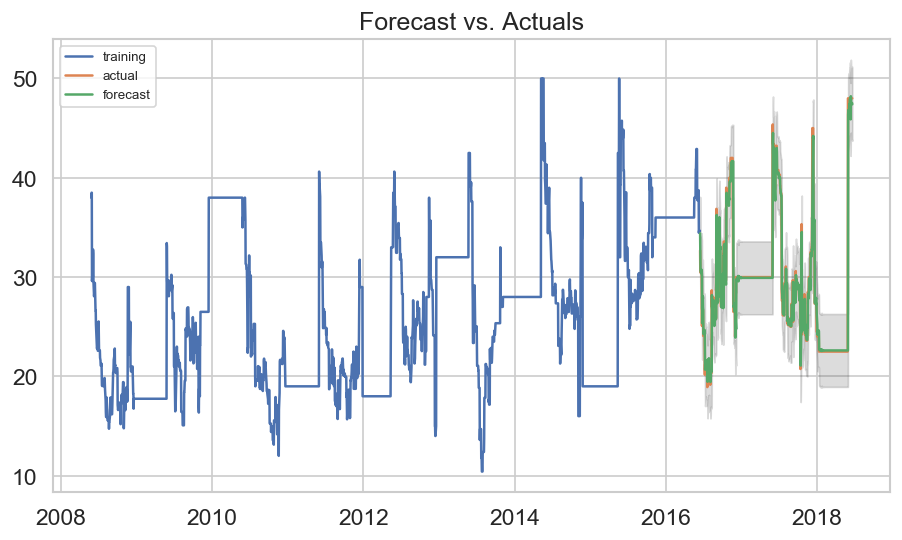

-------------------------
price_plywood
                               SARIMAX Results                                
Dep. Variable:          price_plywood   No. Observations:                 2626
Model:                ARIMA(1, 0, 10)   Log Likelihood               -4169.905
Date:                Tue, 31 Mar 2020   AIC                           8365.810
Time:                        13:31:09   BIC                           8442.162
Sample:                    05-27-2008   HQIC                          8393.460
                         - 06-19-2018                                         
Covariance Type:                  opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
const         12.8158      0.463     27.679      0.000      11.908      13.723
ar.L1          0.9201      0.010     90.525      0.000       0.900       0.940
ma.L1       

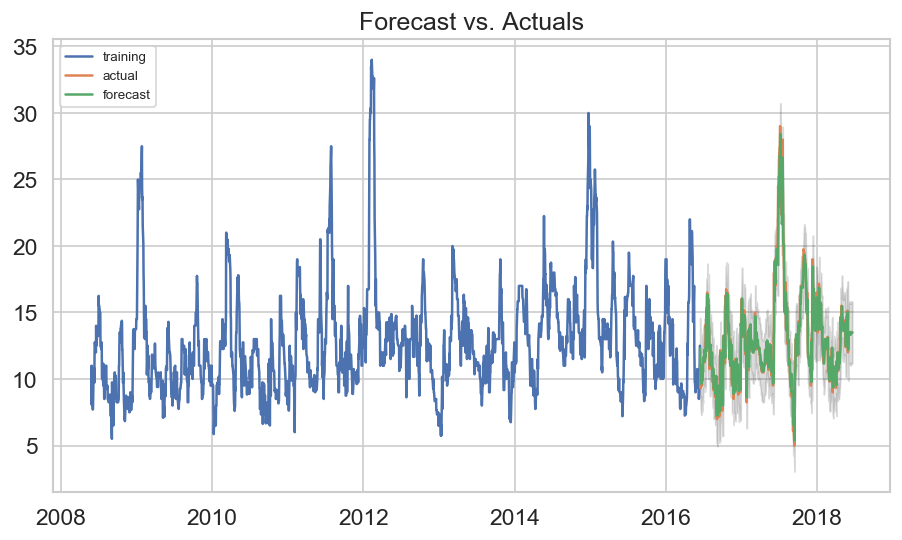

In [27]:
train_model_fits = []
forecasts = []
for m in price_cols:
    # m_order = (arima_params[m]['p'], 0, arima_params[m]['q'])
    m_order = (arima_params[m]['p'], 0, 10)
    model = sm.tsa.arima.ARIMA(df_filled[m], order=m_order)
    model_fit = model.fit()
    train_model_fits.append(model_fit)
    print('-' * 25)
    print(m)
    print(model_fit.summary())
    fc = model_fit.get_prediction(train.shape[0])
    fc_df = fc.summary_frame()
    forecasts.append(fc)
    # plt.figure(figsize(12, 5), dpi=200)
    plt.plot(train[m], label='training')
    plt.plot(test[m], label='actual')
    plt.plot(fc_df['mean'], label='forecast')
    plt.fill_between(fc_df.index, fc_df['mean_ci_lower'], fc_df['mean_ci_upper'],
                     color='k', alpha=0.15)
    plt.title('Forecast vs. Actuals')
    plt.legend(loc='upper left', fontsize=8)
    plt.show()

### Make data monthly averages

In [28]:
df_monthly = df_filled.copy()
for m in price_cols:
    df_monthly[m] = df_monthly[m].resample('MS').mean()

display(df_monthly)
df_monthly.shape
df_monthly.iloc[50:100,]
df_monthly.iloc[100:150,]
df_monthly.iloc[150:200,]
# looks like there are only valid entries for the first of the month now
df_monthly = df_monthly.dropna()

,price_steel,price_rebar,price_glass,price_concrete,price_plywood,year,month,day,dayofyear,dayofweek,isweekday,week
Date,,,,,,,,,,,,
2008-05-27,NaN,NaN,NaN,NaN,NaN,2008,5,27,148,1,True,22
2008-05-28,NaN,NaN,NaN,NaN,NaN,2008,5,28,149,2,True,22
2008-05-29,NaN,NaN,NaN,NaN,NaN,2008,5,29,150,3,True,22
2008-05-30,NaN,NaN,NaN,NaN,NaN,2008,5,30,151,4,True,22
2008-06-02,NaN,NaN,NaN,NaN,NaN,2008,6,2,154,0,True,23
...,...,...,...,...,...,...,...,...,...,...,...,...
2018-06-13,NaN,NaN,NaN,NaN,NaN,2018,6,13,164,2,True,24
2018-06-14,NaN,NaN,NaN,NaN,NaN,2018,6,14,165,3,True,24
2018-06-15,NaN,NaN,NaN,NaN,NaN,2018,6,15,166,4,True,24


Not going to use this...

### Grid search over parameters

In [29]:
import itertools

p = (1, )
d = (0, )
q = range(1, 10)
pdq = itertools.product(p, d, q)

m = 'price_plywood'
for param in pdq:
    mod = sm.tsa.arima.ARIMA(df_filled[m])
    results = mod.fit()

# Come back and do this later

References:

- https://www.machinelearningplus.com/time-series/time-series-analysis-python/
- https://docs.google.com/presentation/d/1d39_DpzI7LbKwhQglCm4W_UgJxh2OOwaB-S8s3LDEL4/edit#slide=id.g7e53a4bd5d_0_0
- [altexsoft](https://www.altexsoft.com/blog/business/time-series-analysis-and-forecasting-novel-business-perspectives/)
- [towardsdatascience](https://towardsdatascience.com/an-end-to-end-project-on-time-series-analysis-and-forecasting-with-python-4835e6bf050b)
- https://www.digitalocean.com/community/tutorials/a-guide-to-time-series-visualization-with-python-3
- https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/

In [30]:
# This code is used to run the .py script from beginning to end in the python interpreter
# with open('python/construction_forecasting.py', 'r') as f:
#     exec(f.read())

# plt.close('all')